# Машинное обучение, ВМК МГУ

# Практическое задание 3. Обучение без учителя.

## Общая информация
Дата выдачи: 31.03.2025

Мягкий дедлайн: 15.04.2025 05:00 MSK

Жёсткий дедлайн: 22.04.2025 05:00 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-1-Username.ipynb

Username — ваша фамилия на латинице

## О задании



В этом задании вам предлагается поработать с различными методами кластеризации и посмотреть их работу на различных данных

In [73]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

## Часть 1. Тематическое моделирование текстов.

В этом задании мы сравним разные алгоритмы кластеризации для задачи тематического моделирования.

**Задание 1.1 (1 балл).** Для начала реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Здесь необходимо использовать вариацию с ненормированным лапласианом.

In [74]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        L = np.diag(X.sum(axis=1))- X

        eigenvalues, eigenvectors = np.linalg.eigh(L)
        eigenvectors = eigenvectors / np.sum(eigenvectors, axis=1)

        top_k_indices = np.argsort(eigenvalues)[:self.n_components]

        return eigenvectors[:, top_k_indices]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [75]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

**Задание 1.2 (0.5 балла)** Теперь приступим к применению разных алгоритмов кластеризации для одной из самых популярных задач обучения без учителя: задачи тематического моделирования текстов.

Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. То есть, фактически, перед вами стоит задача кластеризации текстов с тем лишь дополнением что требется не только разбить тексты на группы, но и выделить ключевые слова, определяющие каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [76]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1120,politics,225.txt,Blair to face MPs amid feud talk,Tony Blair faces his first prime minister's q...
1659,sport,347.txt,Moore questions captaincy,Brian Moore believes the England captain shou...
950,politics,055.txt,Kelly trails new discipline power,Teachers could get more powers to remove unru...
18,business,019.txt,India widens access to telecoms,India has raised the limit for foreign direct...
214,business,215.txt,SEC to rethink post-Enron rules,The US stock market watchdog's chairman has s...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [77]:
data['text'] = data['title'] + data['content']
data = data.drop(columns=['title', 'content'])
data.sample(5)

,category,filename,text
2218,tech,395.txt,Cebit fever takes over Hanover Thousands of pr...
1847,tech,024.txt,Game firm holds 'cast' auditions Video game fi...
2116,tech,293.txt,File-swappers ready new network Legal attacks ...
2095,tech,272.txt,Windows worm travels with Tetris Users are bei...
242,business,243.txt,Making your office work for you Our mission to...


In [78]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
self_stop_words = set(['said', 'say', 'ha', 'wa'])

def preprocess_text(text):
  tokenized_text = word_tokenize(text.lower())

  tokens = [word for word in tokenized_text if word.isalpha()]

  lemmatizer = WordNetLemmatizer()
  lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]

  preprocess_tokens = [word for word in lemmatized_tokens if (word not in stop_words) and (word not in self_stop_words)]
  return ' '.join(preprocess_tokens)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [79]:
data['text'] = data['text'].map(preprocess_text)

data.sample(5)

,category,filename,text
1312,politics,417.txt,lib dems unveil election slogan liberal democr...
1439,sport,127.txt,kewell wait injury drag liverpool winger harry...
1911,tech,088.txt,voter flock blog award site voting way annual ...
169,business,170.txt,house price suffer festive fall uk house price...
1604,sport,292.txt,wale coach elated win mike ruddock paid tribut...


Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [80]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

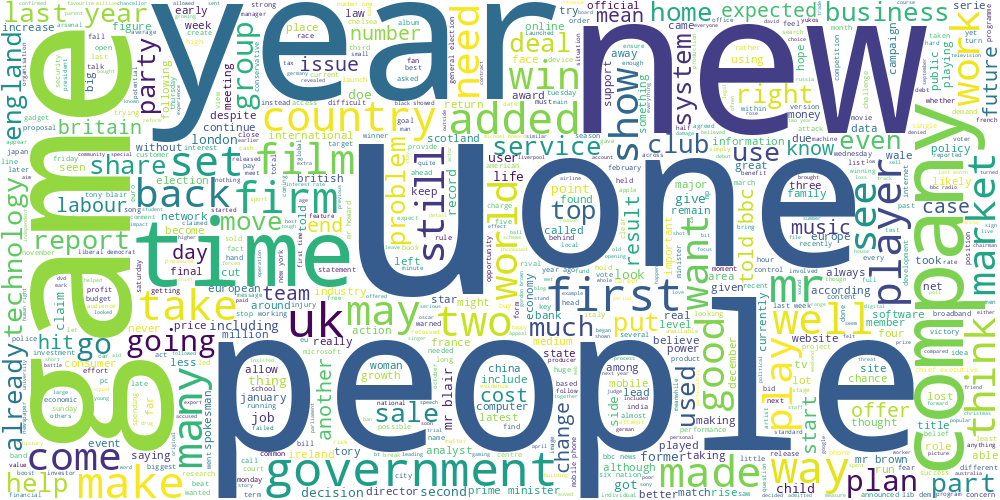

In [81]:
draw_wordcloud(data.text)

**Задание 1.3 (1 балл).** Начнем с простого: обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. (?) Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** В целом, все темы получились интерпретируемыми. 1-ая тема - бизнес, 2-ая тема - нефть, 3-ая тема - кино, 4-ая тема - спорт, 5-ая тема - интернет-технологии, 6-ая тема - смешанная тема кино и государства, 7-ая тема - экономика, 8-ая тема - правительство.

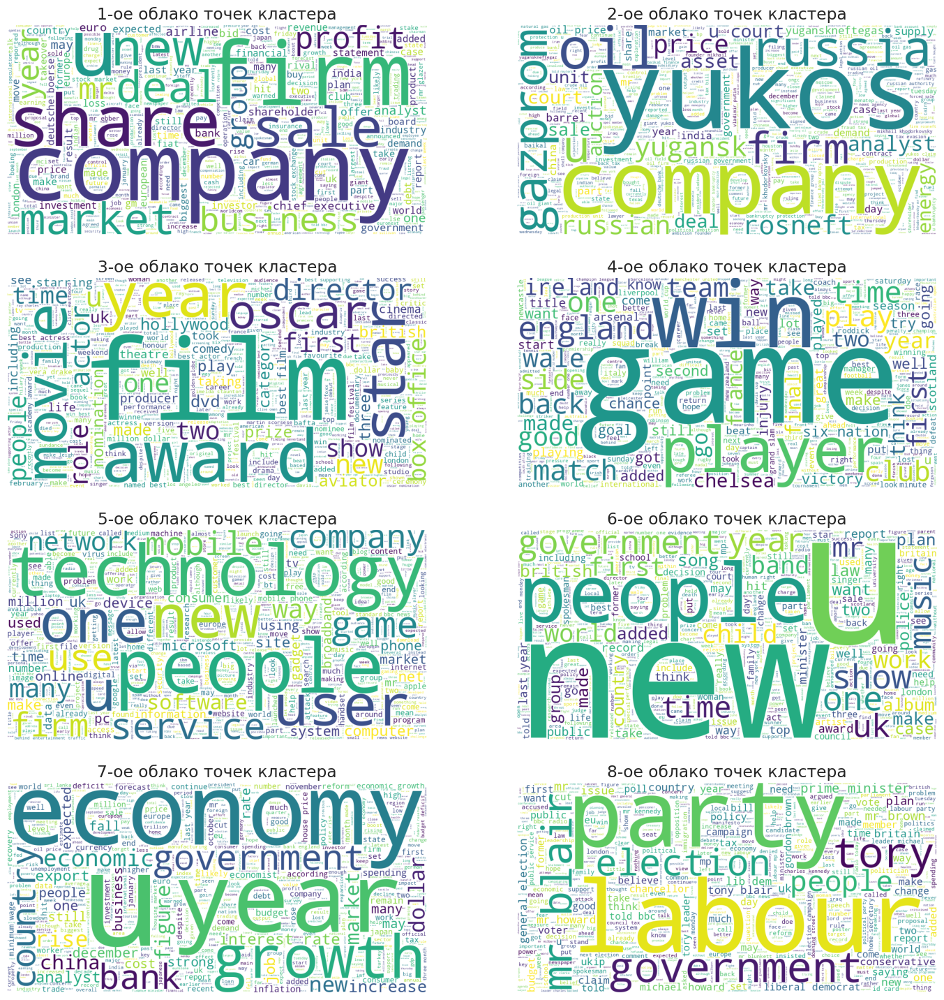

In [82]:
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt

kmeans = KMeans(n_clusters=8)
vectorizer = TfidfVectorizer(max_features=1000, min_df=2, max_df=0.9)

X = vectorizer.fit_transform(data.text)

clusters = kmeans.fit_predict(X)

plt.figure(figsize=(18, 18))

for i in range(8):
  cluster_text = data.text[clusters == i]
  plt.subplot(4, 2, i+1)
  plt.imshow(draw_wordcloud(cluster_text))

  plt.title(f"{i+1}-ое облако точек кластера")
  plt.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.show()


**Задание 1.4 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на несколько слов с наибольшими числовыми значениями. (?) Соответствуют ли полученные слова облакам тегов из прошлого задания?

**Ответ:** Да, главные слова из центров кластеров имеют для каждой темы точно такое же значение, что было проинтерпретировано с помощью облаков слов.

In [83]:
centers = kmeans.cluster_centers_

top_k_indices = np.argsort(centers, axis=1)[:, -10:]
word_to_index = vectorizer.vocabulary_

idx2word = {index: word for word, index in word_to_index.items()}

for idx, row in enumerate(top_k_indices, start=1):
  words = [idx2word[elem] for elem in row]
  print(f"Слова из {idx} кластера: {words}")



Слова из 1 кластера: ['deal', 'airline', 'year', 'market', 'mr', 'sale', 'profit', 'share', 'firm', 'company']
Слова из 2 кластера: ['firm', 'court', 'energy', 'tax', 'company', 'price', 'russia', 'russian', 'oil', 'yukos']
Слова из 3 кластера: ['director', 'movie', 'actress', 'festival', 'star', 'oscar', 'actor', 'best', 'award', 'film']
Слова из 4 кластера: ['play', 'champion', 'injury', 'club', 'cup', 'match', 'win', 'england', 'player', 'game']
Слова из 5 кластера: ['net', 'game', 'software', 'service', 'computer', 'user', 'people', 'phone', 'technology', 'mobile']
Слова из 6 кластера: ['new', 'uk', 'government', 'mr', 'album', 'would', 'band', 'year', 'music', 'show']
Слова из 7 кластера: ['figure', 'market', 'price', 'dollar', 'year', 'economic', 'bank', 'rate', 'growth', 'economy']
Слова из 8 кластера: ['tax', 'would', 'howard', 'brown', 'tory', 'blair', 'party', 'election', 'labour', 'mr']


**Задание 1.5 (можно получить 1.5, 1 или 2.5 баллов)** Попробуем усовершенствовать метод. Реализуйте в приведенном ниже шаблоне ядерный K-means(1.5 баллов) или эллипсоидный метод(1 балл) (можно оба сразу, тогда баллы сложатся). И попробуйте применить его для решаемой задачи. (?)Насколько существенно отличаются  центры кластеров и облака тегов от таковых для предыдущих методов?

In [84]:
class EllipseKMeans:
    def __init__(self, n_clusters, iters):
        """
        KMeans Class constructor.

        Args:
        n_clusters (int) : Number of clusters used for partitioning.
        iters (int) : Number of iterations until the algorithm stops.

        """
        self.n_clusters = n_clusters
        self.iters = iters

        self.centroids = None

    def initialize_clusters(self, X, n_clusters):
        """
        Initialize centroids.

        Args:
        X (ndarray): Dataset samples
        n_clusters (int): Number of clusters

        Returns:
        centroids (ndarray): Initial position of centroids
        """
        kmeans = KMeans(n_clusters=n_clusters, max_iter=1, n_init=1)
        kmeans.fit(X)
        return kmeans.cluster_centers_

    def fit_predict(self, X):
        """
        Implementation of the kernel KMeans algorithm.

        Args:
        X (ndarray): Dataset samples

        Returns:
        centroids (ndarray): Computed centroids
        labels (ndarray): Predicts for each sample in the dataset.
        """
        self.centroids = self.initialize_clusters(X, self.n_clusters)

        N, d = X.shape
        for iteration in range(self.iters):
          # получение обратных ковариационных матриц
          inv_cov_matrix = np.zeros((self.n_clusters, d, d))

          for i in range(self.n_clusters):
            if iteration > 0:
              g = X[y == i] - self.centroids[i]
            else:
              g = X - self.centroids[i]

            inv_cov_matrix[i, :, :] = np.linalg.pinv((g.T @ g) / N + np.eye(d, d) * 1e-6)

          # подсчет y
          y = np.zeros(N)
          for i in range(N):
            g = np.expand_dims(-self.centroids + X[i], axis=2)
            y[i] = np.argmin(np.sqrt(g.transpose(0, 2, 1) @ inv_cov_matrix @ g))

          # пересчет центров кластеров
          for k in range(self.n_clusters):
            self.centroids[k] = np.mean(X[y == k], axis=0)

        # получение labels
        y = np.zeros(N)
        for i in range(N):
          g = np.expand_dims(-self.centroids + X[i], axis=2)
          y[i] = np.argmin(np.sqrt(g.transpose(0, 2, 1) @ inv_cov_matrix @ g))

        return self.centroids, y


    def get_centroids(self):
        """
        Return the computed centroids
        """
        return self.centroids

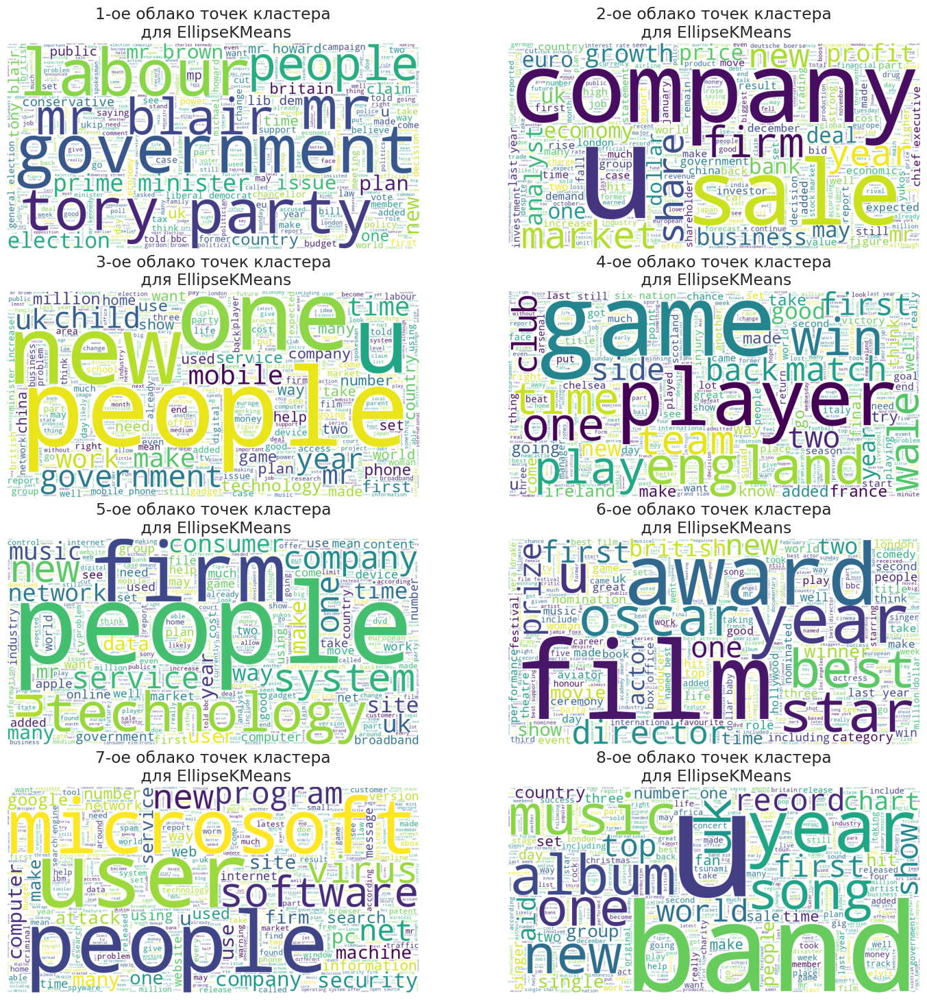

In [85]:
# облако слов для EllipseKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt

kmeans = EllipseKMeans(n_clusters=8, iters=10)

centroids, clusters = kmeans.fit_predict(X.toarray())

plt.figure(figsize=(18, 18))

for i in range(8):
  cluster_text = data.text[clusters == i]
  plt.subplot(4, 2, i+1)
  plt.imshow(draw_wordcloud(cluster_text))

  plt.title(f"{i+1}-ое облако точек кластера\n для EllipseKMeans")
  plt.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.show()

In [86]:
# центры кластеров для EllipseKMeans

top_k_indices = np.argsort(centroids, axis=1)[:, -10:]
word_to_index = vectorizer.vocabulary_

idx2word = {index: word for word, index in word_to_index.items()}

for idx, row in enumerate(top_k_indices, start=1):
  words = [idx2word[elem] for elem in row]
  print(f"Слова из {idx} кластера: {words}")


Слова из 1 кластера: ['howard', 'government', 'minister', 'would', 'tory', 'party', 'election', 'blair', 'labour', 'mr']
Слова из 2 кластера: ['bank', 'growth', 'firm', 'price', 'year', 'profit', 'market', 'share', 'company', 'sale']
Слова из 3 кластера: ['new', 'million', 'government', 'year', 'would', 'child', 'people', 'phone', 'mobile', 'mr']
Слова из 4 кластера: ['wale', 'cup', 'play', 'club', 'team', 'match', 'win', 'player', 'england', 'game']
Слова из 5 кластера: ['apple', 'mr', 'would', 'service', 'people', 'music', 'consumer', 'system', 'technology', 'firm']
Слова из 6 кластера: ['prize', 'year', 'director', 'festival', 'star', 'oscar', 'actor', 'best', 'award', 'film']
Слова из 7 кластера: ['window', 'net', 'computer', 'pc', 'security', 'program', 'virus', 'user', 'software', 'microsoft']
Слова из 8 кластера: ['year', 'number', 'record', 'single', 'song', 'aid', 'music', 'album', 'chart', 'band']


**Ответ:** В EllipseKMeans темы стали менее интерпретируемые (не все), некоторые темы стали подробнее раскрывать значениею Здесь также представлены некоторые темы, которые получились в KMeans. Здесь, как-будто, схожие в главном темы не объединились в кластера, а получили отдельные, что заметно, если проинтерпретировать центры кластеров. EllipseKMeans дает возможность строить кластера разной плотности и размера.

**Задание 1.6 (0.5 балла).** Теперь попробуем сравнить три разных алгоритма кластеризации. Получите три разбиения на кластеры с помощью алгоритмов K-Means(любого понравившегося), DBSCAN(можно взять готовый из sklearn) и спектральной кластеризации, реализованной вами выше. Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

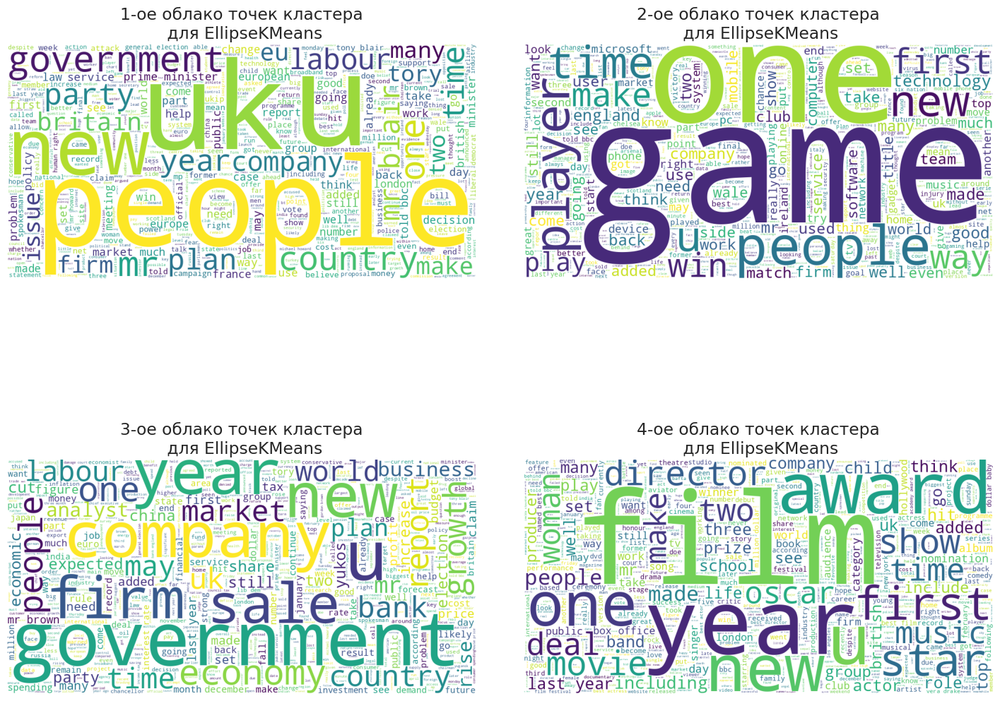

In [87]:
num_themes = 4
kmeans = EllipseKMeans(n_clusters=num_themes, iters=10)

_, ellipse_clusters = kmeans.fit_predict(X.toarray())

plt.figure(figsize=(18, 14))

for i in range(num_themes):
  cluster_text = data.text[ellipse_clusters == i]
  plt.subplot(2, 2, i+1)
  plt.imshow(draw_wordcloud(cluster_text))

  plt.title(f"{i+1}-ое облако точек кластера\n для EllipseKMeans")
  plt.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.show()

Среднее: 1.3694391075065082
Медиана: 1.3821826812849949


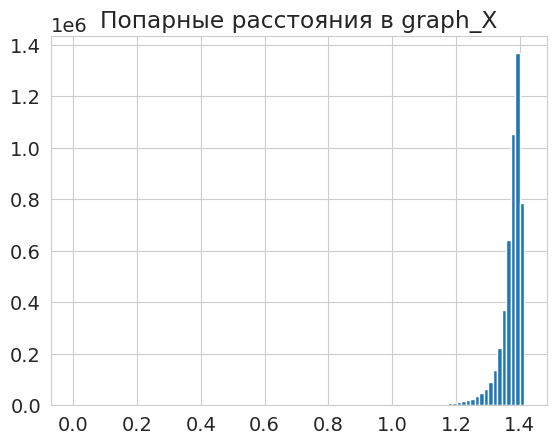

In [88]:
from sklearn.metrics import pairwise_distances

graph_X = pairwise_distances(X, metric='euclidean')

print(f"Среднее: {graph_X.mean()}")
print(f"Медиана: {np.median(graph_X)}")
plt.hist(graph_X.ravel(), bins=100)
plt.title("Попарные расстояния в graph_X")
plt.show()

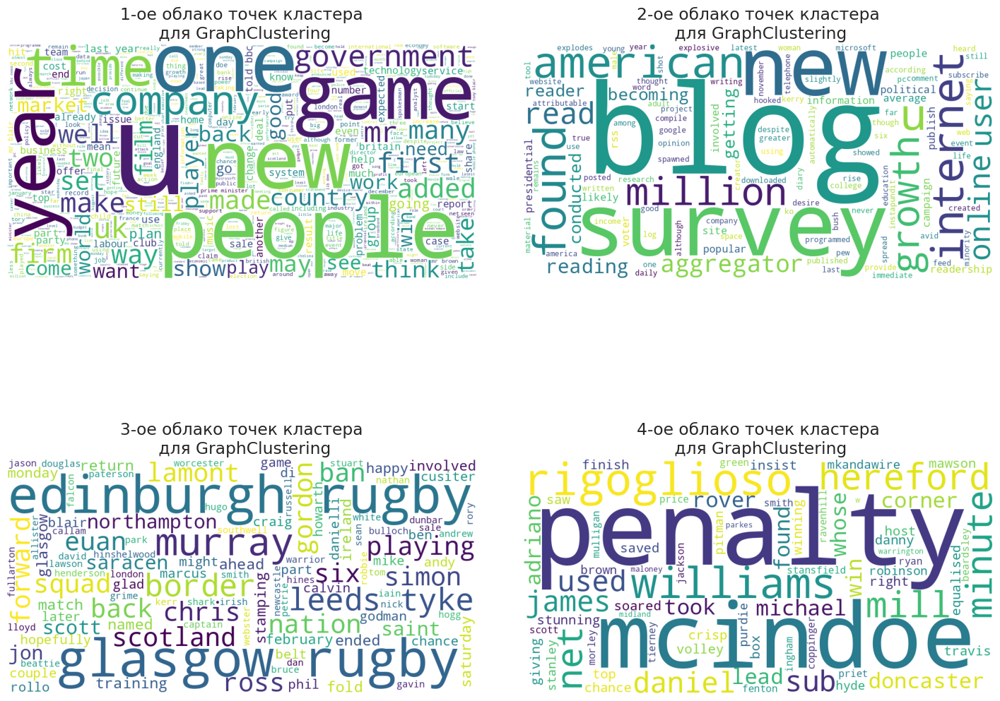

In [89]:
graph_clustering = GraphClustering(n_clusters=num_themes)

graph_X = pairwise_distances(X, metric='euclidean')
sigma = np.mean(graph_X)
W = np.exp(-graph_X**2 / (2*sigma**2))

graph_clusters = graph_clustering.fit_predict(W)

plt.figure(figsize=(18, 14))

for i in range(num_themes):
  cluster_text = data.text[graph_clusters == i]
  plt.subplot(2, 2, i+1)
  plt.imshow(draw_wordcloud(cluster_text))

  plt.title(f"{i+1}-ое облако точек кластера\n для GraphClustering")
  plt.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.show()

In [91]:
from sklearn.cluster import DBSCAN

for eps in np.linspace(1, 1.5, 100):
  dbscan = DBSCAN(eps=eps, min_samples=60)
  labels = dbscan.fit_predict(X)

  n_clusters = len(np.unique(labels)) - (1 if -1 in labels else 0)
  if abs(n_clusters - 4) < 2:
    print(f"Кластеров = {n_clusters} и eps={eps}")


Кластеров = 3 и eps=1.1515151515151516
Кластеров = 3 и eps=1.1565656565656566
Кластеров = 4 и eps=1.1616161616161615
Кластеров = 4 и eps=1.1666666666666667
Кластеров = 4 и eps=1.1717171717171717
Кластеров = 4 и eps=1.176767676767677
Кластеров = 3 и eps=1.202020202020202


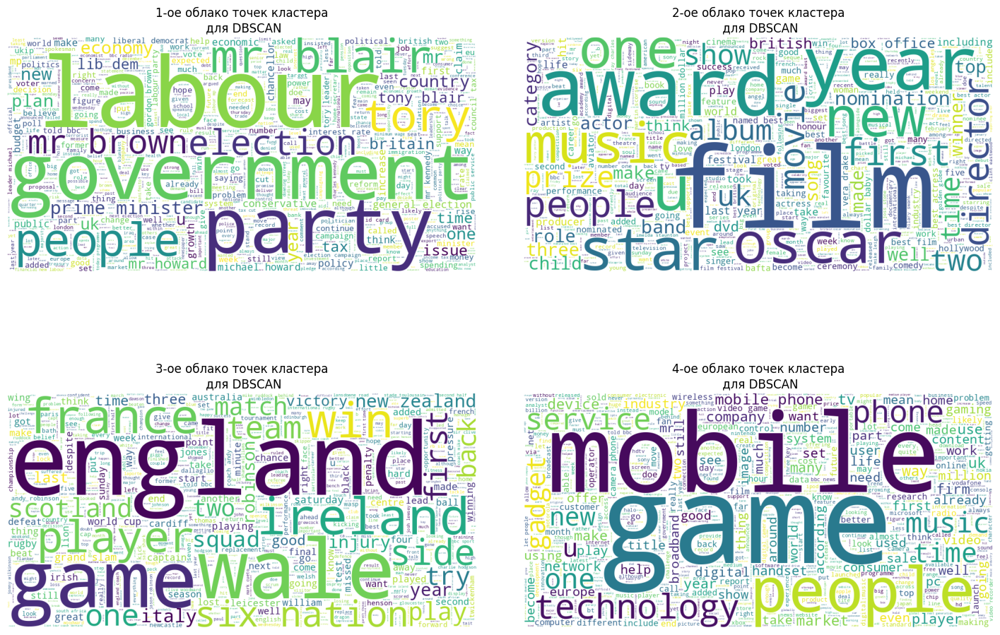

In [ ]:
dbscan = DBSCAN(eps=1.176767676767677, min_samples=60)
dbscan_clusters = dbscan.fit_predict(X)

plt.figure(figsize=(18, 12))

for i in range(4):
  cluster_text = data.text[dbscan_clusters == i]
  plt.subplot(2, 2, i+1)
  plt.imshow(draw_wordcloud(cluster_text))

  plt.title(f"{i+1}-ое облако точек кластера\n для DBSCAN")
  plt.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.show()

(?) Теперь постройте облака слов и снова проинтерпретируйте темы.

**Ответ:** Для EllipseKMeans: 1-ая тема - правительство, 2-ая тема - смешанная тема технологий и спорта, 3-ая тема - смешанная тема правительства и экономики, 4-ая тема - музыка и кино. \\
Для GraphClustering: 1-ая тема - все намешанные текста, преобладают самые частые слова (не интерпретируемая), 2-ая тема - блог, технологии (не очень интерепретируемая тема), 3-ая тема - регби, 4-ая тема - какие-то имена (не интерпретируемая) \\
Для DBSCAN: 1-ая тема - правительство, 2-ая тема - музыка и кино, 3-ая тема - спорт, 4-ая тема - технологии.

**Задание 1.6 (1 балл).** Также, для анализа качества кластеризации иногда бывает полезно "посмотреть" накластеры. Обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({'font.size': 14})
sns.set_style('whitegrid')

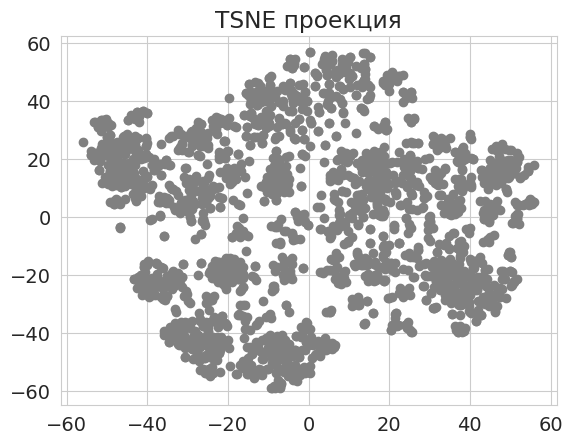

In [ ]:
tsne = TSNE(n_components=2)
X_2d = tsne.fit_transform(X.toarray())

plt.scatter(X_2d[:, 0], X_2d[:, 1], color='gray')
plt.title("TSNE проекция")
plt.show()

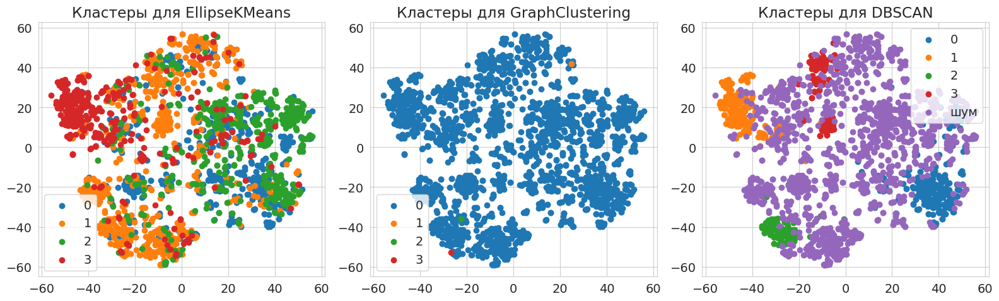

In [ ]:
plt.figure(figsize=(16, 5))

# для EllipseKMeans
plt.subplot(1, 3, 1)
plt.title("Кластеры для EllipseKMeans")

for k in range(num_themes):
  mask = ellipse_clusters == k
  plt.scatter(X_2d[mask, 0], X_2d[mask, 1], label=str(k))
plt.legend()

# для GraphClustering
plt.subplot(1, 3, 2)
plt.title("Кластеры для GraphClustering")

for k in range(num_themes):
  mask = graph_clusters == k
  plt.scatter(X_2d[mask, 0], X_2d[mask, 1], label=str(k))
plt.legend()

# для DBSCAN
plt.subplot(1, 3, 3)
plt.title("Кластеры для DBSCAN")

for k in range(4):
  mask = dbscan_clusters == k
  plt.scatter(X_2d[mask, 0], X_2d[mask, 1], label=str(k))

mask = dbscan_clusters == -1
plt.scatter(X_2d[mask, 0], X_2d[mask, 1], label="шум")
plt.legend()

plt.tight_layout()
plt.show()

(?) Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Сделаете выводы о каждом исследованном в части 1 алгоритме и их применимости к задаче тематического моделирования. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:** Рассмотрим EllipseKMeans. Форма кластеров эллипсоидная (особенность учета данных у модели), заметно, что кластеры примерно, можно считать, одного размера, со схожей плотностью, четкого разделения на границы кластеров не наблюдается, но темы интерпретируемые. Это особенность модели, потому что она может учитывать слова схожей темы, даже если они далеки в евклидовом пространстве. \\
Рассмотрим спектральную кластеризацию (GraphClustering). На графике можно наблюдать, что разделения на кластеры не произошло. Это может быть, потому что модель чувствительна к гиперпараметрам и поэтому требует точной настройки под данные. Темы не интерпретируемы, разделения нет. \\
Рассмотрим DBSCAN. Сам алгоритм не требует определения заранее количества кластеров, что вызывает затруднения при подборе гиперпараметров. Алгоритм учитывает шум, выделяя их в отдельный "кластер". Заметно, что кластеры имеют разную форму и плотность, в чем особенность алгоритма, но минус - много данных классифицируется, как шум, что, конечно, улучшает разделимость данных, относительно EllipseKMeans, но теряет многие данные.

## Часть 2. Transfer learning для задачи классификации текстов.

**Задание 3.1 (4 балла).** Вспомним, что у нас есть разметка для тематик статей. Просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 1:13:6. 70% выборки будем использовать для обучения, а остальные 30% для валидации

Обучите метрику Махаланобиса любыми **тремя**  методами (отсюда)[http://contrib.scikit-learn.org/metric-learn/supervised.html] только на маленьком куске (5%) обучающей выборки. Кластеризуйте данные методом k-means с обученными метриками  и проанализирйте полученные результаты.

Сравните 3 подхода к класификации:

Логистическая регрессия на tf-idf признаках

K-Means с евклидовой метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

K-Means с обученной метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всей обучающей выборке целиком (70%), а итоговый классификатор и обучение метрики обучайте только на ее маленьком куске (5%). Подберите гиперпараметры моделей по качеству на валидационной выборке (30%), а затем оцените качество на тестовой выборке (не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации).

**В качестве метрики качества используйте accuracy**

Можете провести дополнительные исследования с другими методами кластеризации и получить более высокое качество. За качественные исследования с хорошим описанием можно получить **до 2 бонусных баллов**.

In [ ]:
from sklearn.model_selection import train_test_split

# разбиение данных
X = data.text

idx2categories = np.unique(data.category)
categories2idx = {category: idx for idx, category in enumerate(idx2categories)}

y = np.array([categories2idx[category] for category in data.category])

X_global_train, X_test, y_global_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_global_train, y_global_train, test_size=0.3, random_state=42)
X_t, X_metric, y_t, y_metric = train_test_split(X_train, y_train, test_size=1/14, random_state=42)

# подготовка tf-idf признаков

vectorizer = TfidfVectorizer(max_features=1000, min_df=2, max_df=0.9)
X_train_vec = vectorizer.fit_transform(X_train)

X_t_vec = vectorizer.transform(X_t)
X_metric_vec = vectorizer.transform(X_metric)
X_val_vec = vectorizer.transform(X_val)
X_test_vec = vectorizer.transform(X_test)

In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# логистическая регрессия на tf-idf признаках
max_accuracy = 0
max_C = None
best_classificator = None

for C in np.logspace(-3, 0, 20):
  classificator = LogisticRegression(max_iter=1000, C=C, random_state=42)
  classificator.fit(X_metric_vec, y_metric)

  y_val_pred = classificator.predict(X_val_vec)
  acc = accuracy_score(y_val, y_val_pred)
  if acc > max_accuracy:
    max_accuracy = acc
    max_C = C
    best_classificator = classificator

print(f"Лучший классификатор c C={C:.3f} с точностью: {max_accuracy:.4f}")

y_test_pred = best_classificator.predict(X_test_vec)

print(f"Точность на обычной логистической регрессии: {accuracy_score(y_test, y_test_pred):.4f}")

Лучший классификатор c C=1.000 с точностью: 0.7329
Точность на обычной логистической регрессии: 0.7545


In [67]:
# kmeans с евклидовой метрикой на tf-idf + логрег на расстояниях до центров кластеров

kmeans = KMeans(n_clusters=300)
kmeans.fit(X_train_vec)

X_metric_clust = kmeans.transform(X_metric_vec)
X_test_clust = kmeans.transform(X_test_vec)
X_val_clust = kmeans.transform(X_val_vec)

max_accuracy = 0
max_C = None
best_classificator = None

for C in np.logspace(-3, 0, 20):
  classificator = LogisticRegression(max_iter=1000, C=C, random_state=42)
  classificator.fit(X_metric_clust, y_metric)

  y_val_pred = classificator.predict(X_val_clust)
  acc = accuracy_score(y_val, y_val_pred)
  if acc > max_accuracy:
    max_accuracy = acc
    max_C = C
    best_classificator = classificator

print(f"Лучший классификатор c C={C:.3f} с точностью: {max_accuracy:.4f}")

y_test_pred = best_classificator.predict(X_test_clust)

print(f"Точность на KMeans с евклидовой метрикой + логистической регрессии: {accuracy_score(y_test, y_test_pred):.4f}")

Лучший классификатор c C=1.000 с точностью: 0.8632
Точность на KMeans с евклидовой метрикой + логистической регрессии: 0.8683


In [57]:
!pip install metric_learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 2.1 MB/s eta 0:00:00


In [68]:
# kmeans с обученной метрикой Махаланобиса на tf-idf + логрег на расстояниях до центров кластеров
from metric_learn import NCA

nca = NCA(max_iter=1000)
X_metric_nca = nca.fit_transform(X_metric_vec.toarray(), y_metric)
X_train_nca = nca.transform(X_train_vec.toarray())
X_val_nca = nca.transform(X_val_vec.toarray())
X_test_nca = nca.transform(X_test_vec.toarray())

kmeans = KMeans(n_clusters=300)
kmeans.fit(X_train_nca)

X_metric_clust = kmeans.transform(X_metric_nca)
X_test_clust = kmeans.transform(X_test_nca)
X_val_clust = kmeans.transform(X_val_nca)

max_accuracy = 0
max_C = None
best_classificator = None

for C in np.logspace(-3, 0, 20):
  classificator = LogisticRegression(max_iter=1000, C=C, random_state=42)
  classificator.fit(X_metric_clust, y_metric)

  y_val_pred = classificator.predict(X_val_clust)
  acc = accuracy_score(y_val, y_val_pred)
  if acc > max_accuracy:
    max_accuracy = acc
    max_C = C
    best_classificator = classificator

print(f"Лучший классификатор c C={C:.3f} с точностью: {max_accuracy:.4f}")

y_test_pred = best_classificator.predict(X_test_clust)

print(f"Точность на KMeans с обученной метрикой + логистической регрессии: {accuracy_score(y_test, y_test_pred):.4f}")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Лучший классификатор c C=1.000 с точностью: 0.8889
Точность на KMeans с обученной метрикой + логистической регрессии: 0.9012


(?) Сделайте выводы о применимости методов кластеризации для улучшения качества классификации. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:** При использовании подобранного на валидации и обученной на маленьком количестве данных логистической регрессии был получен результат около 0.75 точность на тестовых данных. При дополнительном использовании не размеченных (пайплайн не видел меток данных) данных из обучающей выборки для обучения KMeans и только после него обученной логистической регрессии модель показала лучше качество (около 0.86), потому что кроме знаний о метках модель попыталась предсказать распределение данных, и эти знания улучшили итоговое качество на тестовой выборке. Далее, при использовании схожего пайплайна, но с обучением метрики перед кластеризации (на всё тех же размеченных данных) на тестовой выборке улучшается качество. Это связано с тем, что используемая нами метрика NCA обучает данные так, что близкие объекты становятся ближе, а далекие еще дальше, таким образом, шумы уменьшаются, признаки становятся менее зависимыми. Это улучшает качество кластеризации: границы кластеров становятся четче, а сами кластеры плотнее.